# Environment Map Learning

This notebook demonstrates how to **learn and represent environment maps** using three different **spherical parameterizations**:

1. **Spherical Harmonics (SH)** –
2. **Spherical Gaussians (SG)** –
3. **Spherical Voronoi (SV)** –

The code provides a complete pipeline to:
- Load and preprocess HDR environment maps (`.exr`);
- Train each model type to reconstruct the lighting distribution;
- Visualize results as lat-long maps and mirror spheres;
- Compare accuracy via PSNR metrics.

This serves as a practical example of *view-dependent lighting representations* for neural rendering and inverse rendering research.


In [ ]:
!apt-get update -qq
!apt-get install -y libopenexr-dev
!pip install openexr-python Imath


import os

url = "https://dl.polyhaven.org/file/ph-assets/HDRIs/exr/1k/goegap_road_1k.exr". # you can choose your own env from polyhaven
filename = "envmap.exr"

if not os.path.exists(filename):
    !wget -O {filename} {url}

exr_path = filename



W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libopenexr-dev is already the newest version (2.5.7-1).
0 upgraded, 0 newly installed, 0 to remove and 48 not upgraded.


In [ ]:
import os
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

import OpenEXR
import Imath
from scipy.ndimage import zoom, gaussian_filter
from tqdm import tqdm


WIDTH = 854
HEIGHT = 480
BLUR = 2.5

def get_device(device=None):
    if device is None:
        return torch.device("cuda" if torch.cuda.is_available() else "cpu")
    return torch.device(device)


def real_sh_basis(max_degree: int, rd: torch.Tensor) -> torch.Tensor:
    rd = F.normalize(rd.to(torch.float64), dim=-1)
    x, y, z = rd.unbind(-1)
    y = y.clamp(-1.0, 1.0)

    theta = torch.acos(y)
    phi = torch.atan2(z, x)
    cos_theta = torch.cos(theta)
    sin_theta = torch.sqrt(torch.clamp(1.0 - cos_theta**2, min=0.0))

    B = rd.shape[0]
    device = rd.device
    P = {}
    P[(0, 0)] = torch.ones(B, dtype=torch.float64, device=device)

    for m in range(0, max_degree + 1):
        if m > 0:
            P_mm_prev = P[(m - 1, m - 1)]
            P_mm = -(2 * m - 1) * sin_theta * P_mm_prev
            P[(m, m)] = P_mm
        else:
            P_mm = P[(0, 0)]

        if m < max_degree:
            P[(m + 1, m)] = (2 * m + 1) * cos_theta * P_mm

        for l in range(m + 2, max_degree + 1):
            P_lm_prev = P[(l - 1, m)]
            P_lm_prev2 = P[(l - 2, m)]
            denom = (l - m)
            P[(l, m)] = ((2 * l - 1) * cos_theta * P_lm_prev - (l + m - 1) * P_lm_prev2) / denom

    def N_lm(l, m):
        m_abs = abs(m)
        num = math.factorial(l - m_abs)
        den = math.factorial(l + m_abs)
        ratio = num / den
        return math.sqrt((2.0 * l + 1.0) / (4.0 * math.pi) * ratio)

    Y_list = []
    for l in range(0, max_degree + 1):
        for m in range(-l, l + 1):
            absm = abs(m)
            P_lm = P[(l, absm)]
            N = N_lm(l, m)
            if m == 0:
                Y_lm = N * P_lm
            elif m > 0:
                Y_lm = math.sqrt(2.0) * N * torch.cos(m * phi) * P_lm
            else:
                Y_lm = math.sqrt(2.0) * N * torch.sin(absm * phi) * P_lm
            Y_list.append(Y_lm)

    Y = torch.stack(Y_list, dim=-1)
    Y = torch.nan_to_num(Y, nan=0.0, posinf=0.0, neginf=0.0)
    return Y.to(torch.float32)


class SHModel(nn.Module):
    def __init__(self, max_degree=31, device=None, L_curr=0):
        super().__init__()
        self.max_degree = max_degree
        self.device = get_device(device)
        self.V = 1
        self.K = (max_degree + 1) ** 2
        self.L_curr = L_curr

        self._sh_coeffs = nn.Parameter(torch.zeros(self.V, 3, self.K, device=self.device))
        with torch.no_grad():
            self._sh_coeffs[:, :, :9].normal_(mean=0.0, std=1e-4)
            self._sh_coeffs[:, :, 0].add_(1.0)

        self.optimizer = torch.optim.Adam(
            [
                {"params": [self._sh_coeffs], "lr": 1.25e-4, "name": "sh_coeff"},
            ],
            lr=0.0,
            eps=1e-15,
        )

    def forward(self, rd: torch.Tensor, iteration: int) -> torch.Tensor:
        if iteration > 0 and iteration % 1000 == 0:
            self.L_curr += 1
            self.L_curr = min(self.L_curr, self.max_degree)

        L = max(self.L_curr, 0)
        M_act = min((L + 1) ** 2, self.K)

        rd = F.normalize(rd.to(self.device), dim=-1)
        Y = real_sh_basis(L, rd)[:, :M_act]

        coeffs_act = self._sh_coeffs[:, :, :M_act]
        coeffs_act = coeffs_act[0]

        rgb = Y @ coeffs_act.permute(1, 0)
        return rgb

    def save(self, path):
        torch.save(
            {
                "sh_coeffs": self._sh_coeffs.data,
                "max_degree": self.max_degree,
                "L_curr": self.L_curr,
            },
            path,
        )

    def load(self, path):
        ckpt = torch.load(path, map_location=self.device)
        self.max_degree = ckpt.get("max_degree", self.max_degree)
        self.L_curr = ckpt.get("L_curr", 0)
        with torch.no_grad():
            self._sh_coeffs.data.copy_(ckpt["sh_coeffs"])


def fibonacci_sphere(N, device=None):
    device = get_device(device)
    indices = torch.arange(0, N, dtype=torch.float32, device=device) + 0.5
    phi = math.pi * (3.0 - math.sqrt(5.0))
    y = 1 - (indices / N) * 2
    radius = torch.sqrt(1 - y ** 2)
    theta = phi * indices
    x = torch.cos(theta) * radius
    z = torch.sin(theta) * radius
    return torch.stack([x, y, z], dim=1)


class SGModel(nn.Module):
    def __init__(
        self,
        num_lobes=32,
        max_sharpness=128.0,
        min_sharpness=64.0,
        init_alpha_scale=0.01,
        device=None,
    ):
        super().__init__()
        self.num_lobes = num_lobes
        self.device = get_device(device)
        self.max_sharpness = max_sharpness
        self.min_sharpness = min_sharpness

        self._mu = nn.Parameter(fibonacci_sphere(num_lobes, device=self.device))
        self._alpha = nn.Parameter(
            init_alpha_scale * torch.rand(num_lobes, 3, device=self.device)
        )

        init_sh = (min_sharpness + 1.0) + torch.rand(num_lobes, 1, device=self.device) * (
            max_sharpness - (min_sharpness + 1.0)
        )
        self._sharpness_raw = nn.Parameter(init_sh)

        self.optimizer = torch.optim.Adam(
            [
                {"params": [self._mu], "lr": 1e-3},
                {"params": [self._alpha], "lr": 5e-4},
                {"params": [self._sharpness_raw], "lr": 1e-2},
            ],
            lr=0.0,
            eps=1e-15,
        )

    def forward(self, rd: torch.Tensor) -> torch.Tensor:
        rd = F.normalize(rd.to(self.device), dim=-1)
        lobes_dir = F.normalize(self._mu, dim=-1)
        sharpness = F.softplus(self._sharpness_raw)

        dot = (lobes_dir.unsqueeze(0) * rd.unsqueeze(1)).sum(dim=-1, keepdim=True)
        sg_val = torch.relu(self._alpha.unsqueeze(0)) * torch.exp(
            sharpness.unsqueeze(0) * (dot - 1.0)
        )

        return sg_val.sum(dim=1)

    def save(self, path):
        torch.save(
            {
                "mu": self._mu.data,
                "alpha": self._alpha.data,
                "sharpness": self._sharpness_raw.data,
                "num_lobes": self.num_lobes,
                "max_sharpness": self.max_sharpness,
                "min_sharpness": self.min_sharpness,
            },
            path,
        )

    def load(self, path):
        ckpt = torch.load(path, map_location=self.device)
        self.num_lobes = ckpt["num_lobes"]
        self.max_sharpness = ckpt["max_sharpness"]
        self.min_sharpness = ckpt["min_sharpness"]
        with torch.no_grad():
            self._mu.data.copy_(ckpt["mu"])
            self._alpha.data.copy_(ckpt["alpha"])
            self._sharpness_raw.data.copy_(ckpt["sharpness"])


def softplus_inv(x: float) -> float:
    return math.log(math.exp(x) - 1.0)


class VoronoiModel(nn.Module):
    def __init__(self, num_sites, init_beta=128.0, device=None,
                 lr_sites=1e-4, lr_colors=1e-3, lr_beta=1e-3,
                 beta_min=0.5, beta_max=512.0):
        super().__init__()
        self.num_sites = num_sites
        self.device = get_device(device)
        self.beta_min = beta_min
        self.beta_max = beta_max

        vectors = fibonacci_sphere(num_sites, device=self.device).reshape(num_sites, 1, 3)
        self._sites = nn.Parameter(vectors)

        init_beta_clamped = float(max(beta_min, min(beta_max, init_beta)))
        beta_raw_init = softplus_inv(init_beta_clamped)
        self._beta_raw = nn.Parameter(torch.ones((1, 1, 1), device=self.device) * beta_raw_init)

        self._colors = nn.Parameter(torch.ones((num_sites, 1, 3), device=self.device) * 0.5)

        params = [
            {"params": [self._sites], "lr": lr_sites,  "name": "sites"},
            {"params": [self._colors], "lr": lr_colors, "name": "colors"},
            {"params": [self._beta_raw], "lr": lr_beta, "name": "beta"},
        ]
        self.optimizer = torch.optim.Adam(params, lr=0.0, eps=1e-15)

    def beta(self):
        b = F.softplus(self._beta_raw)
        return torch.clamp(b, self.beta_min, self.beta_max)

    def forward(self, wo: torch.Tensor) -> torch.Tensor:
        wo = F.normalize(wo.to(self.device), dim=-1)
        sites_dir = F.normalize(self._sites, dim=-1)
        beta = self.beta()
        scores = (sites_dir * wo.unsqueeze(1).unsqueeze(1)).sum(dim=-1) * beta
        W = torch.softmax(scores, dim=1)
        V = (W * torch.relu(self._colors).squeeze(1).unsqueeze(0)).sum(dim=1)
        return V

    def save(self, path):
        torch.save(
            {
                "sites": self._sites.data,
                "colors": self._colors.data,
                "beta_raw": self._beta_raw.data,
                "num_sites": self.num_sites,
                "beta_min": self.beta_min,
                "beta_max": self.beta_max,
            },
            path,
        )

    def load(self, path):
        ckpt = torch.load(path, map_location=self.device)
        with torch.no_grad():
            self.num_sites = ckpt.get("num_sites", self.num_sites)
            self.beta_min = ckpt.get("beta_min", self.beta_min)
            self.beta_max = ckpt.get("beta_max", self.beta_max)
            self._sites.data.copy_(ckpt["sites"])
            self._colors.data.copy_(ckpt["colors"])
            self._beta_raw.data.copy_(ckpt["beta_raw"])


def mse_to_psnr(mse: torch.Tensor) -> torch.Tensor:
    return -10.0 * torch.log10(mse.clamp(min=1e-8))


def load_exr(filepath):
    exr_file = OpenEXR.InputFile(filepath)
    header = exr_file.header()
    dw = header["dataWindow"]
    width = dw.max.x - dw.min.x + 1
    height = dw.max.y - dw.min.y + 1

    float_type = Imath.PixelType(Imath.PixelType.FLOAT)
    r_str = exr_file.channel("R", float_type)
    g_str = exr_file.channel("G", float_type)
    b_str = exr_file.channel("B", float_type)

    r = np.frombuffer(r_str, dtype=np.float32).reshape(height, width)
    g = np.frombuffer(g_str, dtype=np.float32).reshape(height, width)
    b = np.frombuffer(b_str, dtype=np.float32).reshape(height, width)
    return np.stack([r, g, b], axis=-1)


def resize_envmap(img, new_width=WIDTH, new_height=HEIGHT):
    h, w, c = img.shape
    zoom_factors = (new_height / h, new_width / w, 1)
    return zoom(img, zoom_factors, order=1)


def hdr_to_ldr(img, exposure=1.0, gamma=2.2):
    img = 1.0 - np.exp(-img * exposure)
    img = np.power(np.clip(img, 0, 1), 1.0 / gamma)
    return (img * 255).astype(np.uint8)


def exr_to_dataset(
    filepath,
    resize=True,
    target_width=WIDTH,
    target_height=HEIGHT,
    exposure=1.0,
    gamma=2.2,
    blur_sigma=BLUR,
):
    img = load_exr(filepath)
    if resize:
        img = resize_envmap(img, target_width, target_height)

    img = hdr_to_ldr(img, exposure, gamma)
    img = img.astype(np.float32) / 255.0

    if blur_sigma is not None and blur_sigma > 0:
        img = gaussian_filter(img, sigma=(blur_sigma, blur_sigma, 0), mode="nearest")

    height, width, _ = img.shape

    u = (np.arange(width) + 0.5) / width
    v = (np.arange(height) + 0.5) / height
    u, v = np.meshgrid(u, v)

    theta = u * 2 * np.pi
    phi = v * np.pi

    x = np.sin(phi) * np.cos(theta)
    y = np.cos(phi)
    z = np.sin(phi) * np.sin(theta)

    directions = np.stack([x, y, z], axis=-1).reshape(-1, 3)
    colors = img.reshape(-1, 3)

    weights = np.sin(phi).reshape(-1)
    mean_w = weights.mean()
    if mean_w > 0:
        weights = weights / mean_w

    return directions, colors, weights, (height, width)


def render_mirror_sphere_from_latlong(envmap, out_res=512, device=None):
    device = get_device(device)

    if isinstance(envmap, np.ndarray):
        t = torch.from_numpy(envmap)
    else:
        t = envmap

    if t.ndim == 3 and t.shape[0] in (1, 3):
        pass
    elif t.ndim == 3 and t.shape[-1] == 3:
        t = t.permute(2, 0, 1)
    else:
        raise ValueError("envmap must be (H,W,3) or (3,H,W)")

    t = t.float().unsqueeze(0).to(device)

    lin = torch.linspace(-1.0, 1.0, out_res, device=device)
    yy, xx = torch.meshgrid(lin, lin, indexing="ij")
    r2 = xx**2 + yy**2
    mask = r2 <= 1.0

    z = torch.zeros_like(r2)
    z[mask] = torch.sqrt(1.0 - r2[mask])

    N = torch.stack([xx, yy, z], dim=-1)
    N = F.normalize(N, dim=-1)

    V = torch.tensor([0.0, 0.0, 1.0], device=device)
    V = V / V.norm()

    NV = (N * V).sum(dim=-1, keepdim=True)
    R = 2.0 * NV * N - V
    R = F.normalize(R, dim=-1)

    xR = R[..., 0]
    yR = R[..., 1]
    zR = R[..., 2]

    r_xz = torch.sqrt(xR**2 + zR**2)
    yR_clamp = yR.clamp(-1.0, 1.0)
    phi = torch.atan2(r_xz, yR_clamp)
    theta = torch.atan2(zR, xR)

    u = (theta + math.pi) / (2.0 * math.pi)
    v = phi / math.pi
    v = 1.0 - v

    grid_x = 2.0 * u - 1.0
    grid_y = 2.0 * v - 1.0
    grid = torch.stack([grid_x, grid_y], dim=-1).unsqueeze(0)

    sampled = F.grid_sample(
        t, grid,
        mode="bilinear",
        padding_mode="border",
        align_corners=False,
    )[0]

    sphere = torch.ones_like(sampled)
    sphere[:, mask] = sampled[:, mask]
    sphere = sphere.clamp(0.0, 1.0).cpu().numpy().transpose(1, 2, 0)
    return sphere


def reconstruct_envmap(model, model_type, width, height, device, iteration=0, batch_size=100000):
    device = get_device(device)
    model.eval()
    with torch.no_grad():
        u = (torch.arange(width, device=device) + 0.5) / width
        v = (torch.arange(height, device=device) + 0.5) / height
        v, u = torch.meshgrid(v, u, indexing="ij")

        theta = u * 2 * np.pi
        phi = v * np.pi

        x = torch.sin(phi) * torch.cos(theta)
        y = torch.cos(phi)
        z = torch.sin(phi) * torch.sin(theta)

        directions = torch.stack([x, y, z], dim=-1).reshape(-1, 3)

        colors = []
        for i in range(0, len(directions), batch_size):
            batch = directions[i : i + batch_size]
            if model_type == "sh":
                out = model(batch, iteration)
            else:
                out = model(batch)
            colors.append(out)
        colors = torch.cat(colors, dim=0)
        img = colors.reshape(height, width, 3).clamp(0, 1).cpu()
    model.train()
    return img


def reconstruct_voronoi_tesselation(model: VoronoiModel, width, height, device, batch_size=100000):
    device = get_device(device)
    model.eval()
    with torch.no_grad():
        u = (torch.arange(width, device=device) + 0.5) / width
        v = (torch.arange(height, device=device) + 0.5) / height
        v, u = torch.meshgrid(v, u, indexing="ij")

        theta = u * 2 * np.pi
        phi = v * np.pi

        x = torch.sin(phi) * torch.cos(theta)
        y = torch.cos(phi)
        z = torch.sin(phi) * torch.sin(theta)

        directions = torch.stack([x, y, z], dim=-1).reshape(-1, 3)

        cmap = plt.get_cmap("tab20")
        palette = torch.tensor([cmap(i % cmap.N)[:3] for i in range(model.num_sites)],
                               dtype=torch.float32, device=device)

        sites_dir = F.normalize(model._sites, dim=-1)
        beta = model.beta()

        out_colors = []
        for i in range(0, len(directions), batch_size):
            batch = directions[i : i + batch_size]
            scores = (sites_dir * batch.unsqueeze(1).unsqueeze(1)).sum(dim=-1) * beta
            scores = scores.squeeze(-1)
            idx = scores.argmax(dim=1)
            colors = palette[idx]
            out_colors.append(colors)

        out_colors = torch.cat(out_colors, dim=0)
        img = out_colors.reshape(height, width, 3).clamp(0, 1).cpu()
    model.train()
    return img


def train_env_model(
    exr_path,
    model_type="voronoi",
    model_kwargs=None,
    num_iters=20_000,
    batch_size=4096,
    device=None,
    vis_interval=2000,
):
    device = get_device(device)
    model_kwargs = model_kwargs or {}

    directions_np, colors_np, weights_np, (h, w) = exr_to_dataset(exr_path)
    gt_img = torch.tensor(colors_np.reshape(h, w, 3), dtype=torch.float32)
    gt_sphere = render_mirror_sphere_from_latlong(gt_img.numpy())

    directions = torch.from_numpy(directions_np).float().to(device)
    colors = torch.from_numpy(colors_np).float().to(device)
    weights = torch.from_numpy(weights_np).float().to(device)

    N = directions.shape[0]
    if batch_size > N:
        batch_size = N

    if model_type == "voronoi":
        model = VoronoiModel(
            num_sites=model_kwargs.get("num_sites", 1024),
            init_beta=model_kwargs.get("init_beta", 256.0),
            device=device,
        ).to(device)
    elif model_type == "sg":
        model = SGModel(
            num_lobes=model_kwargs.get("num_lobes", 128),
            max_sharpness=model_kwargs.get("max_sharpness", 128.0),
            min_sharpness=model_kwargs.get("min_sharpness", 64.0),
            device=device,
        ).to(device)
    elif model_type == "sh":
        model = SHModel(
            max_degree=model_kwargs.get("sh_degree", 31),
            device=device,
            L_curr=model_kwargs.get("L_init", 0),
        ).to(device)
    else:
        raise ValueError("model_type must be 'voronoi', 'sg' or 'sh'")

    pbar = tqdm(range(1, num_iters + 1), desc=f"Training [{model_type.upper()}]")

    for it in pbar:
        idx = torch.randint(0, N, (batch_size,), device=device)
        dirs_batch = directions[idx]
        cols_batch = colors[idx]
        w_batch = weights[idx]

        model.optimizer.zero_grad()
        if model_type == "sh":
            pred = model(dirs_batch, it)
        else:
            pred = model(dirs_batch)

        loss = ((pred - cols_batch) ** 2 * w_batch.unsqueeze(-1)).mean()
        loss.backward()
        model.optimizer.step()

        psnr_batch = mse_to_psnr(loss).item()
        if model_type == "voronoi":
            pbar.set_postfix(psnr_b=f"{psnr_batch:.2f}", beta=f"{model.beta().item():.2f}")
        else:
            pbar.set_postfix(psnr_b=f"{psnr_batch:.2f}")

        if it == 1 or it % vis_interval == 0:
            with torch.no_grad():
                pred_img = reconstruct_envmap(
                    model, model_type, width=w, height=h, device=device, iteration=it
                )
                pred_sphere = render_mirror_sphere_from_latlong(pred_img.numpy())

                if model_type == "voronoi":
                    tess_img = reconstruct_voronoi_tesselation(model, width=w, height=h, device=device)
                    tess_sphere = render_mirror_sphere_from_latlong(tess_img.numpy())

                    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                    axes[0].imshow(gt_sphere)
                    axes[0].set_title("GT Sphere")
                    axes[0].axis("off")

                    axes[1].imshow(pred_sphere)
                    axes[1].set_title(f"Pred Sphere (iter {it})")
                    axes[1].axis("off")

                    axes[2].imshow(tess_sphere)
                    axes[2].set_title("Voronoi Tesselation")
                    axes[2].axis("off")
                else:
                    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                    axes[0].imshow(gt_sphere)
                    axes[0].set_title("GT Sphere")
                    axes[0].axis("off")

                    axes[1].imshow(pred_sphere)
                    axes[1].set_title(f"Pred Sphere (iter {it})")
                    axes[1].axis("off")

                plt.tight_layout()
                plt.show()

                eval_batch = 100000
                preds_full = []
                for j in range(0, N, eval_batch):
                    d_batch = directions[j:j + eval_batch]
                    if model_type == "sh":
                        out = model(d_batch, it)
                    else:
                        out = model(d_batch)
                    preds_full.append(out)
                preds_full = torch.cat(preds_full, dim=0)

                mse_full = ((preds_full - colors) ** 2 * weights.unsqueeze(-1)).mean()
                psnr_full = mse_to_psnr(mse_full).item()
                print(f"[iter {it}] full-env PSNR: {psnr_full:.2f} dB")

    return model


Training [VORONOI]:   0%|          | 0/5000 [00:00<?, ?it/s, beta=256.00, psnr_b=14.97]

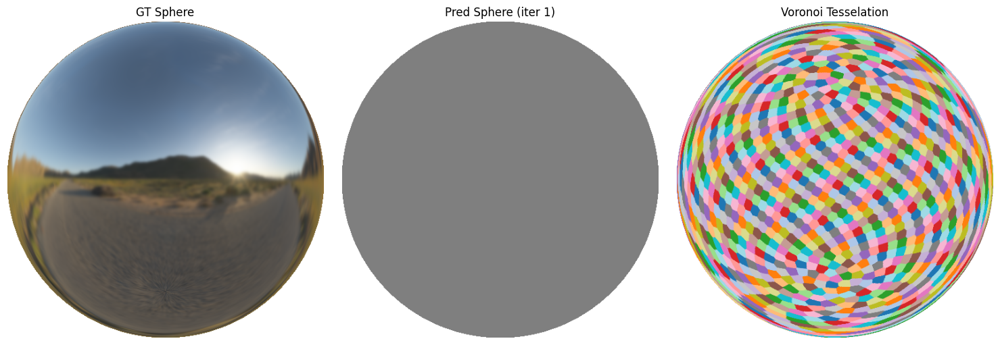

Training [VORONOI]:   0%|          | 13/5000 [00:01<07:18, 11.38it/s, beta=256.03, psnr_b=15.75]

[iter 1] full-env PSNR: 14.88 dB


Training [VORONOI]:  10%|▉         | 497/5000 [00:06<00:38, 116.39it/s, beta=256.60, psnr_b=31.57]

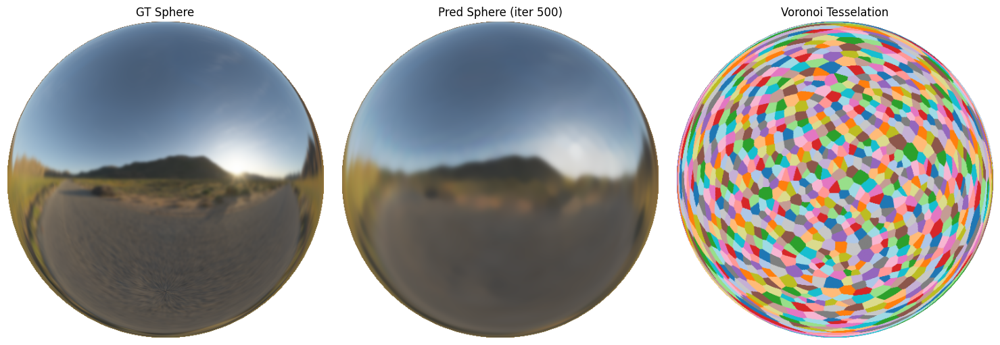

Training [VORONOI]:  10%|█         | 509/5000 [00:08<03:13, 23.17it/s, beta=256.62, psnr_b=31.81]

[iter 500] full-env PSNR: 31.68 dB


Training [VORONOI]:  20%|█▉        | 993/5000 [00:13<00:39, 102.59it/s, beta=256.98, psnr_b=35.74]

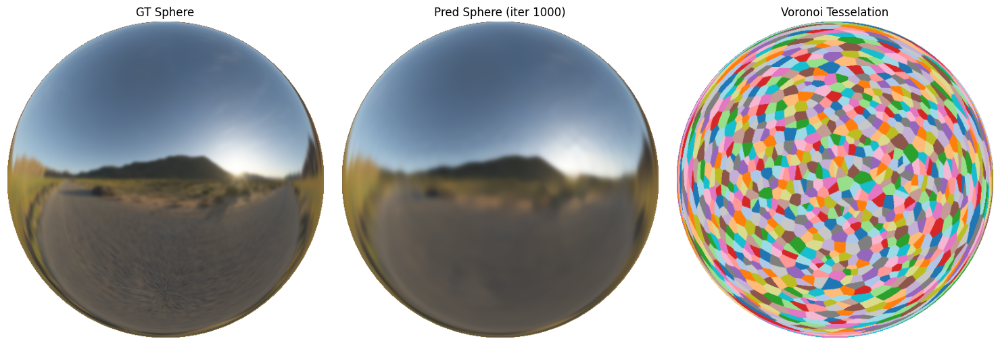

Training [VORONOI]:  20%|██        | 1022/5000 [00:14<02:15, 29.44it/s, beta=257.00, psnr_b=35.90]

[iter 1000] full-env PSNR: 35.69 dB


Training [VORONOI]:  30%|██▉       | 1494/5000 [00:17<00:19, 176.67it/s, beta=257.31, psnr_b=37.10]

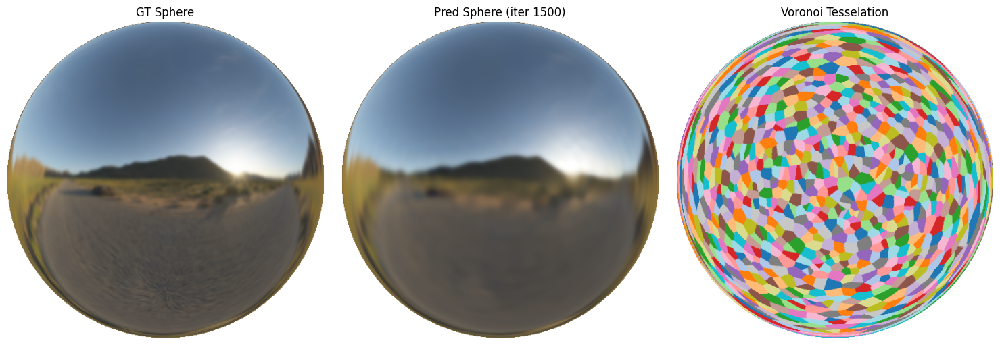

Training [VORONOI]:  31%|███       | 1530/5000 [00:18<00:57, 60.60it/s, beta=257.33, psnr_b=36.47]

[iter 1500] full-env PSNR: 36.79 dB


Training [VORONOI]:  40%|███▉      | 1997/5000 [00:21<00:16, 179.52it/s, beta=257.64, psnr_b=37.33]

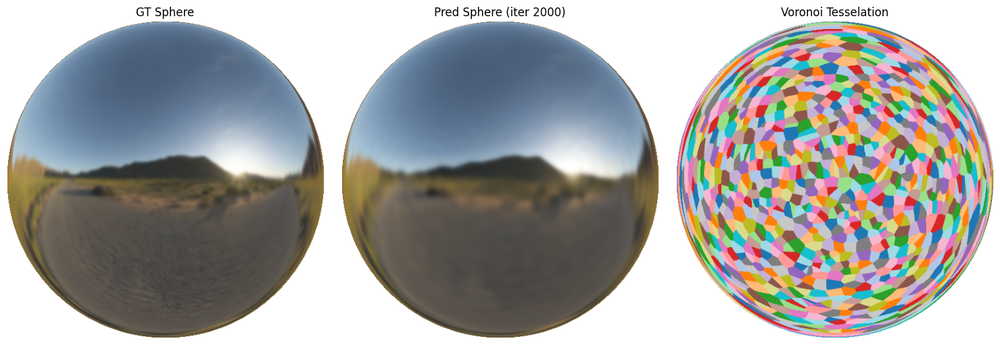

Training [VORONOI]:  41%|████      | 2033/5000 [00:22<00:50, 59.14it/s, beta=257.66, psnr_b=37.09]

[iter 2000] full-env PSNR: 37.40 dB


Training [VORONOI]:  50%|████▉     | 2491/5000 [00:25<00:14, 168.27it/s, beta=257.98, psnr_b=37.56]

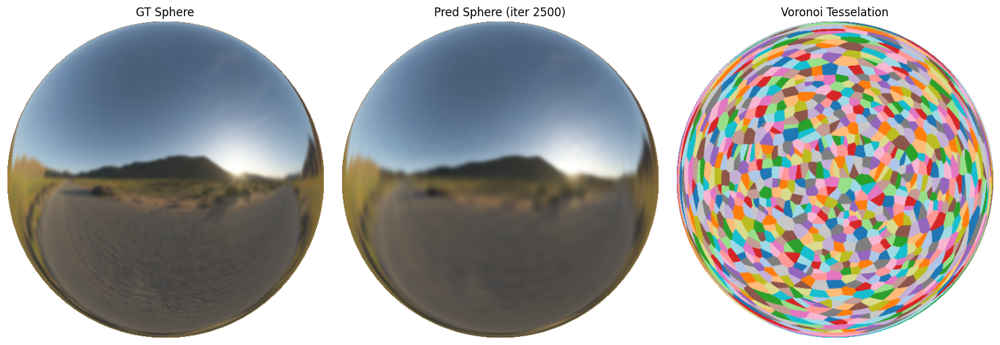

Training [VORONOI]:  51%|█████     | 2526/5000 [00:26<00:49, 50.44it/s, beta=258.01, psnr_b=37.83]

[iter 2500] full-env PSNR: 37.84 dB


Training [VORONOI]:  60%|█████▉    | 2987/5000 [00:29<00:11, 172.23it/s, beta=258.34, psnr_b=38.13]

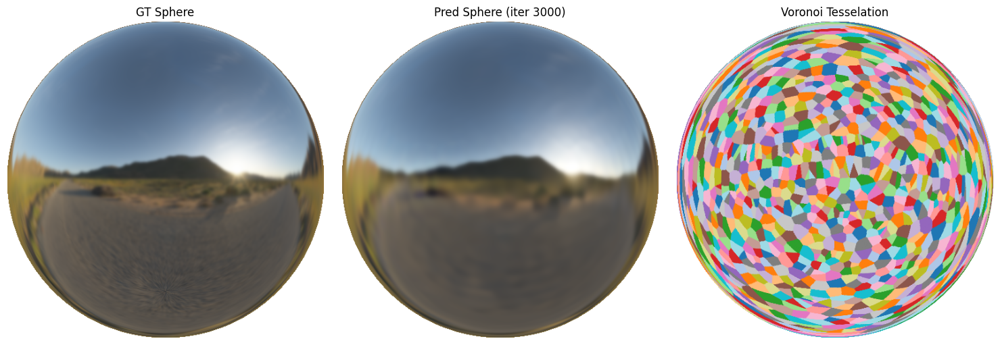

Training [VORONOI]:  60%|██████    | 3024/5000 [00:30<00:33, 59.58it/s, beta=258.36, psnr_b=38.08]

[iter 3000] full-env PSNR: 38.16 dB


Training [VORONOI]:  70%|██████▉   | 3485/5000 [00:32<00:08, 176.23it/s, beta=258.71, psnr_b=38.50]

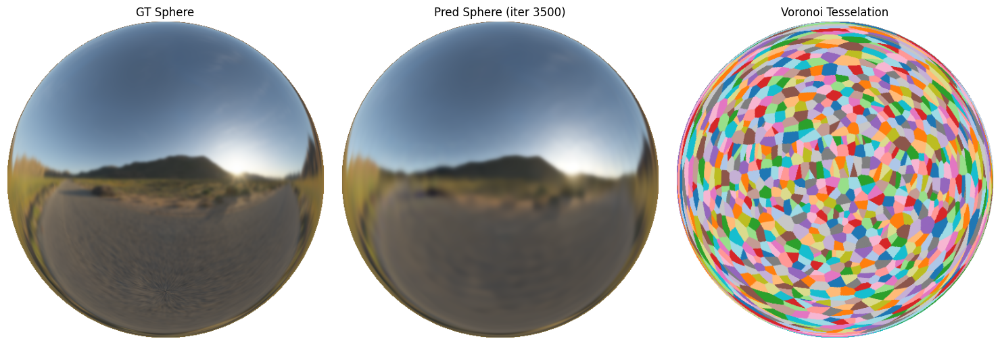

Training [VORONOI]:  70%|███████   | 3522/5000 [00:34<00:24, 59.89it/s, beta=258.74, psnr_b=38.76]

[iter 3500] full-env PSNR: 38.41 dB


Training [VORONOI]:  80%|███████▉  | 3985/5000 [00:36<00:05, 180.93it/s, beta=259.10, psnr_b=38.51]

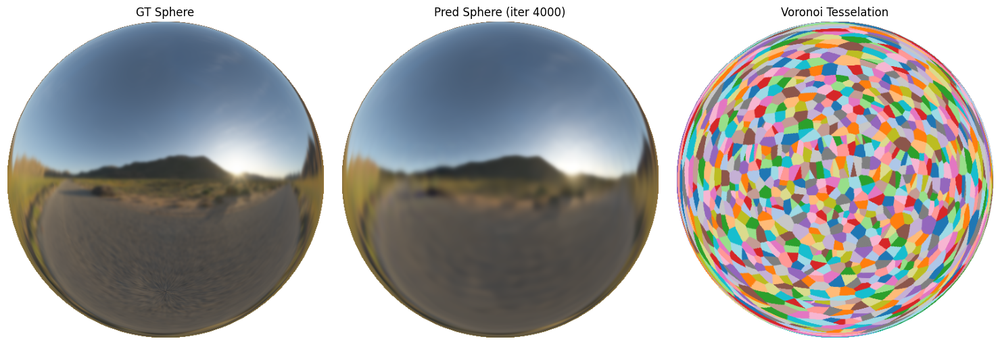

Training [VORONOI]:  80%|████████  | 4023/5000 [00:37<00:15, 61.65it/s, beta=259.13, psnr_b=38.72]

[iter 4000] full-env PSNR: 38.61 dB


Training [VORONOI]:  90%|████████▉ | 4487/5000 [00:40<00:03, 168.30it/s, beta=259.51, psnr_b=38.91]

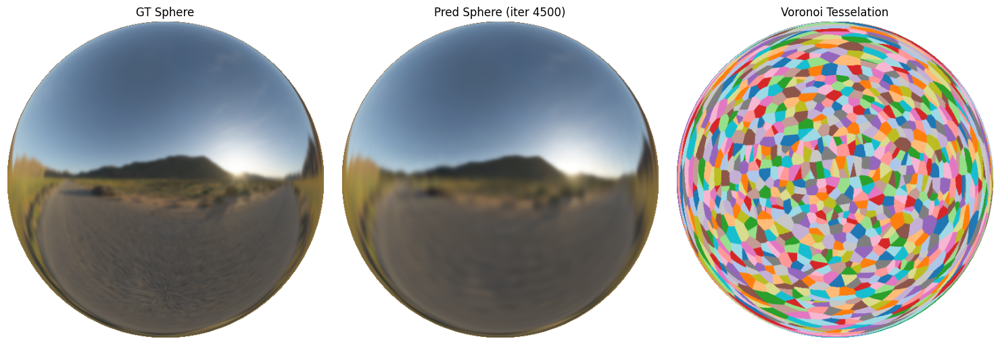

Training [VORONOI]:  90%|█████████ | 4523/5000 [00:41<00:08, 58.17it/s, beta=259.53, psnr_b=39.15]

[iter 4500] full-env PSNR: 38.78 dB


Training [VORONOI]: 100%|█████████▉| 4984/5000 [00:44<00:00, 174.91it/s, beta=259.92, psnr_b=38.74]

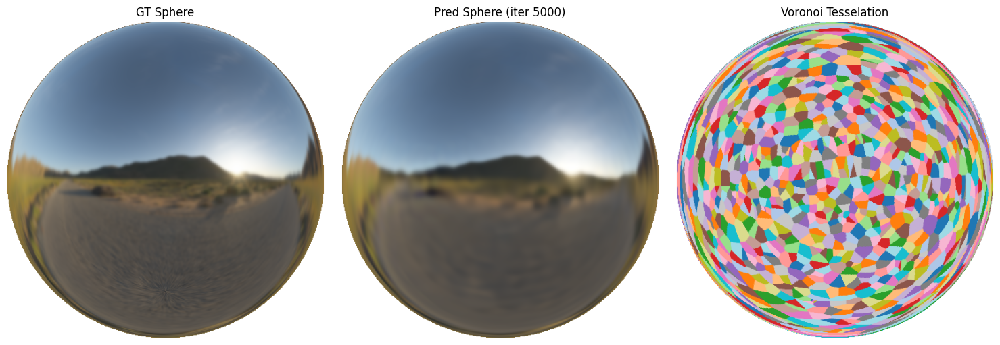

Training [VORONOI]: 100%|██████████| 5000/5000 [00:45<00:00, 110.12it/s, beta=259.92, psnr_b=38.74]

[iter 5000] full-env PSNR: 38.94 dB


In [ ]:
# Example: SV
model = train_env_model(
    exr_path,
    model_type="voronoi",
    model_kwargs={"num_sites": 1024, "init_beta": 256.0},
    num_iters=5000,
    batch_size=4096,
    device=None,
    vis_interval=500,
)


Training [SG]:   0%|          | 0/5000 [00:00<?, ?it/s, psnr_b=7.78]

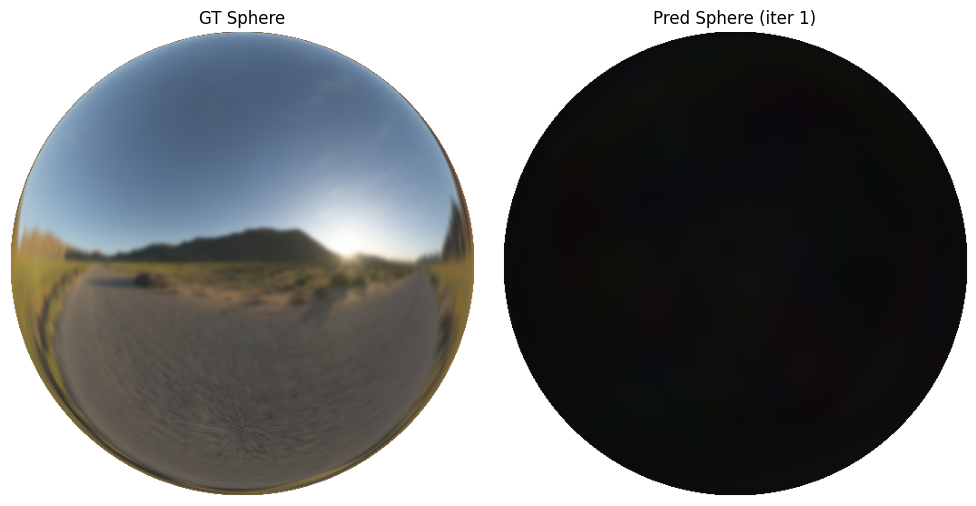

Training [SG]:   0%|          | 24/5000 [00:00<01:29, 55.88it/s, psnr_b=12.81]

[iter 1] full-env PSNR: 7.78 dB


Training [SG]:  10%|▉         | 484/5000 [00:02<00:19, 231.30it/s, psnr_b=26.98]

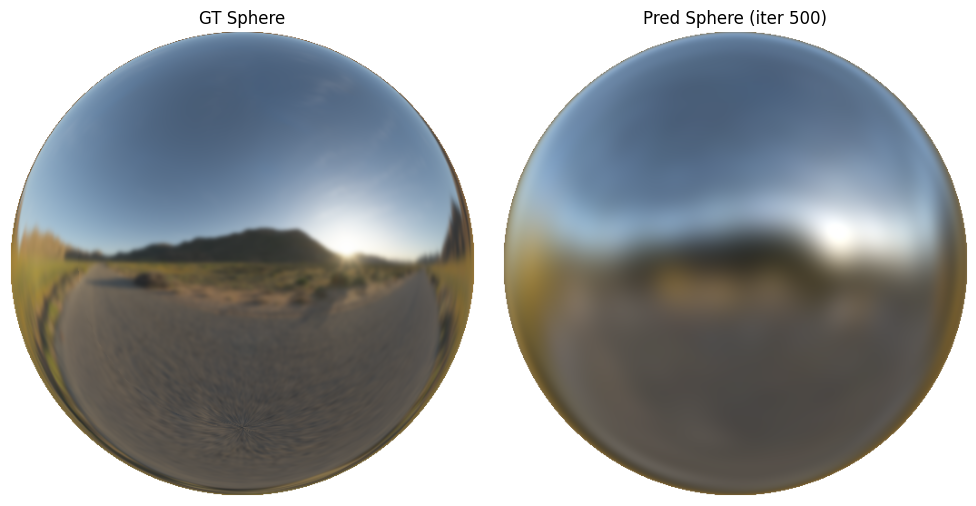

Training [SG]:  11%|█         | 532/5000 [00:03<00:40, 111.39it/s, psnr_b=27.04]

[iter 500] full-env PSNR: 26.92 dB


Training [SG]:  20%|█▉        | 978/5000 [00:05<00:15, 253.80it/s, psnr_b=27.24]

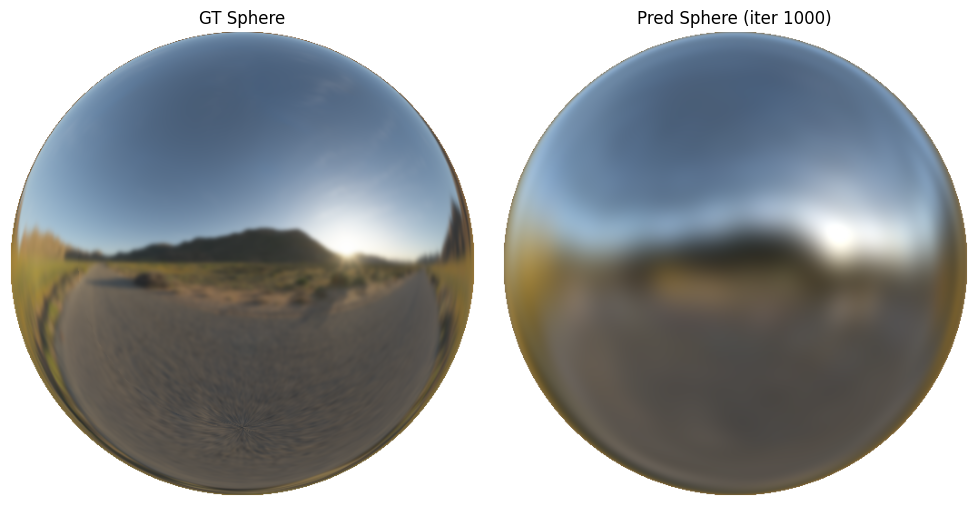

Training [SG]:  20%|██        | 1024/5000 [00:05<00:37, 106.91it/s, psnr_b=27.08]

[iter 1000] full-env PSNR: 27.45 dB


Training [SG]:  30%|██▉       | 1488/5000 [00:07<00:15, 228.35it/s, psnr_b=28.09]

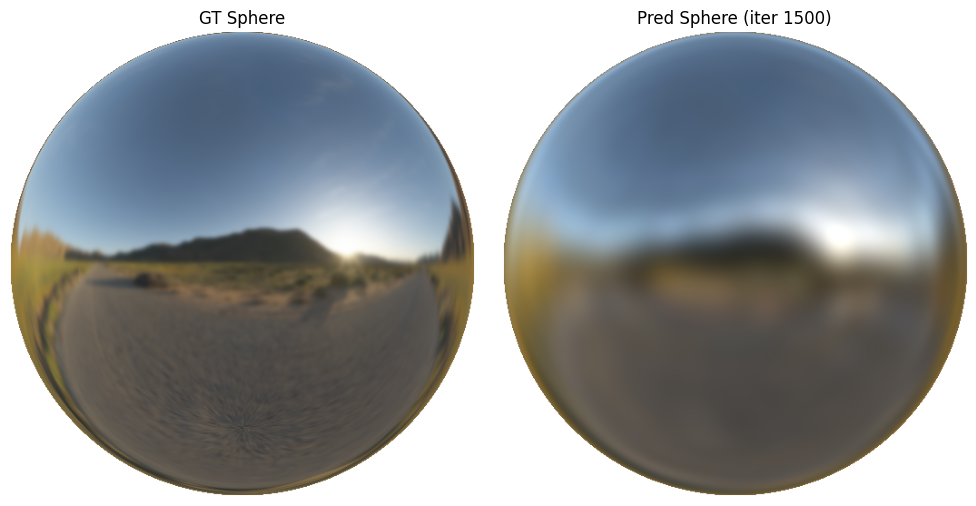

Training [SG]:  31%|███       | 1534/5000 [00:08<00:33, 103.94it/s, psnr_b=28.12]

[iter 1500] full-env PSNR: 27.78 dB


Training [SG]:  40%|███▉      | 1983/5000 [00:10<00:11, 253.89it/s, psnr_b=27.91]

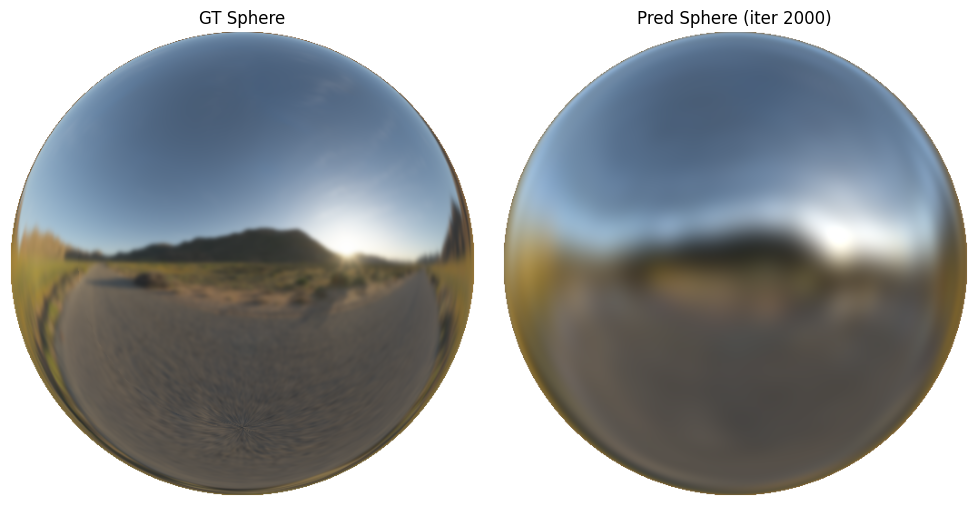

Training [SG]:  41%|████      | 2034/5000 [00:11<00:25, 118.52it/s, psnr_b=28.02]

[iter 2000] full-env PSNR: 28.04 dB


Training [SG]:  50%|████▉     | 2493/5000 [00:15<00:20, 122.10it/s, psnr_b=28.53]

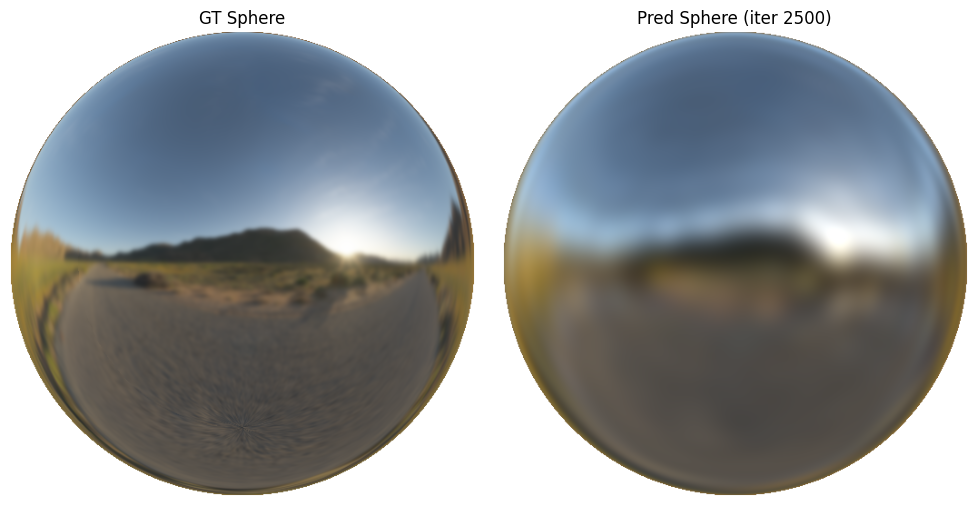

Training [SG]:  50%|█████     | 2520/5000 [00:17<01:13, 33.93it/s, psnr_b=28.12]

[iter 2500] full-env PSNR: 28.26 dB


Training [SG]:  60%|█████▉    | 2987/5000 [00:21<00:16, 123.54it/s, psnr_b=28.99]

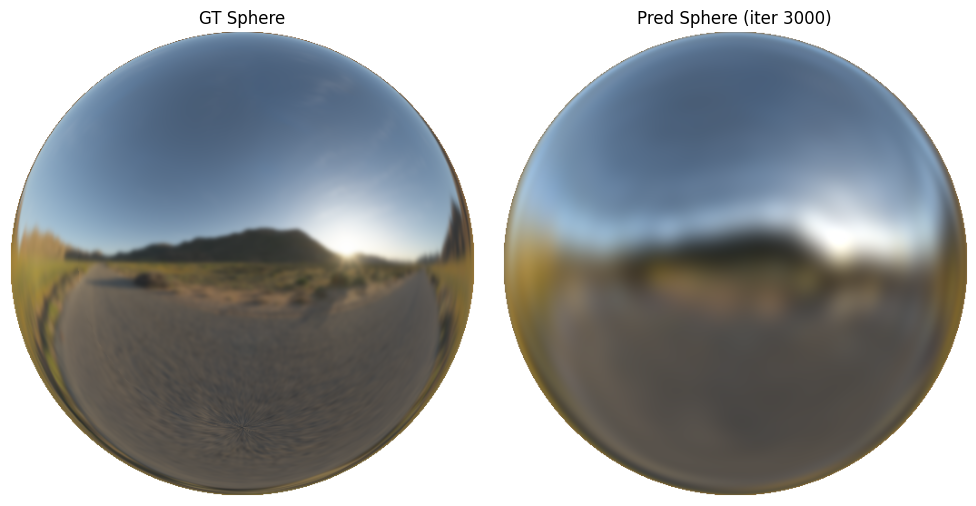

Training [SG]:  60%|██████    | 3014/5000 [00:22<00:47, 41.80it/s, psnr_b=28.26]

[iter 3000] full-env PSNR: 28.49 dB


Training [SG]:  70%|██████▉   | 3491/5000 [00:27<00:14, 102.06it/s, psnr_b=28.80]

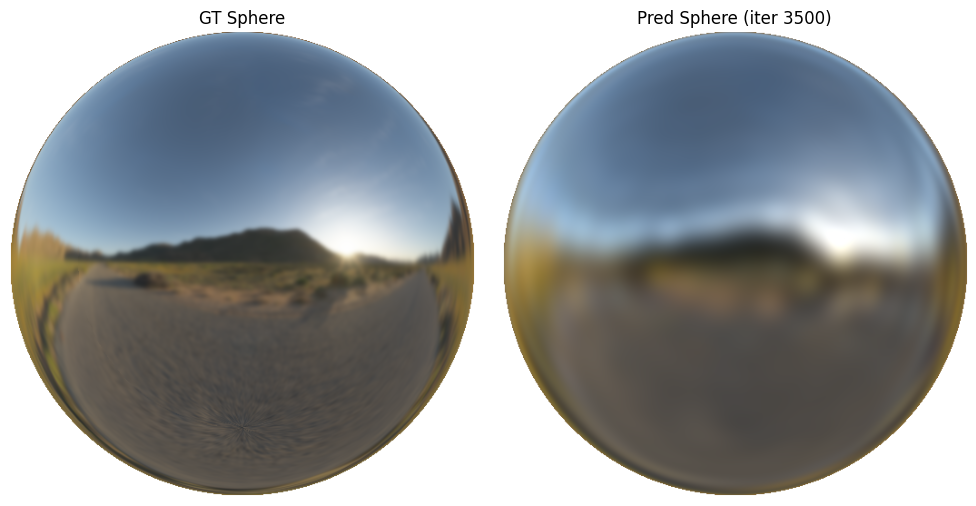

Training [SG]:  70%|███████   | 3510/5000 [00:28<00:50, 29.25it/s, psnr_b=28.59]

[iter 3500] full-env PSNR: 28.69 dB


Training [SG]:  80%|███████▉  | 3999/5000 [00:32<00:07, 142.23it/s, psnr_b=28.72]

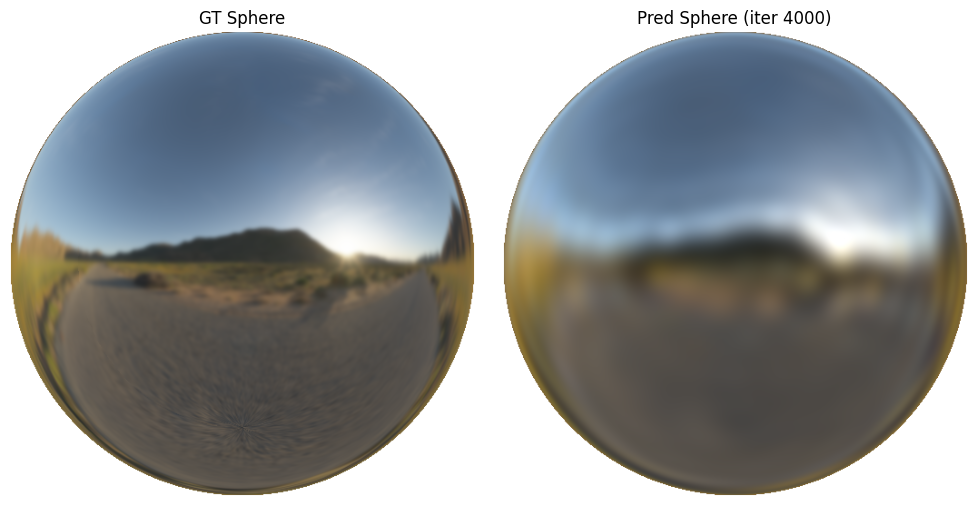

Training [SG]:  80%|████████  | 4014/5000 [00:33<00:32, 29.99it/s, psnr_b=28.55]

[iter 4000] full-env PSNR: 28.85 dB


Training [SG]:  90%|████████▉ | 4487/5000 [00:38<00:04, 122.22it/s, psnr_b=29.08]

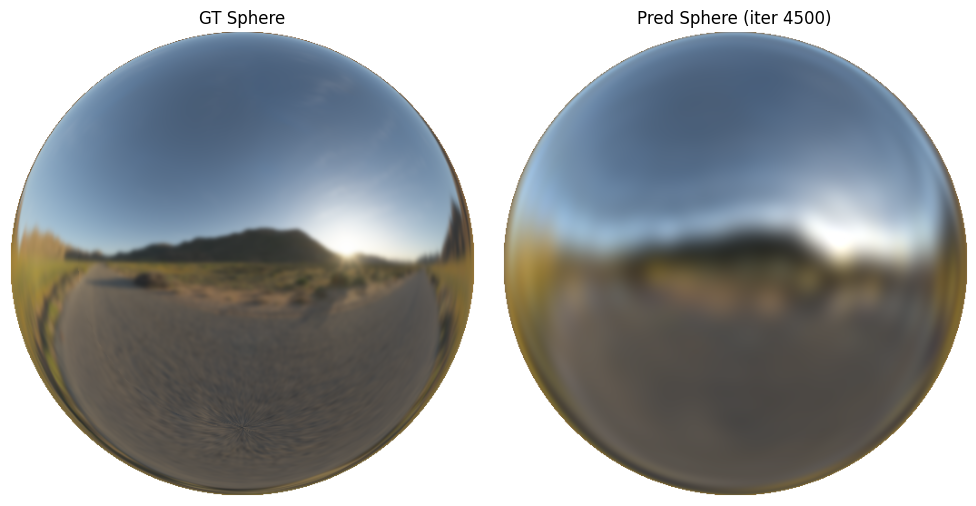

Training [SG]:  90%|█████████ | 4513/5000 [00:39<00:11, 41.70it/s, psnr_b=28.97]

[iter 4500] full-env PSNR: 29.03 dB


Training [SG]: 100%|█████████▉| 4988/5000 [00:42<00:00, 132.65it/s, psnr_b=29.20]

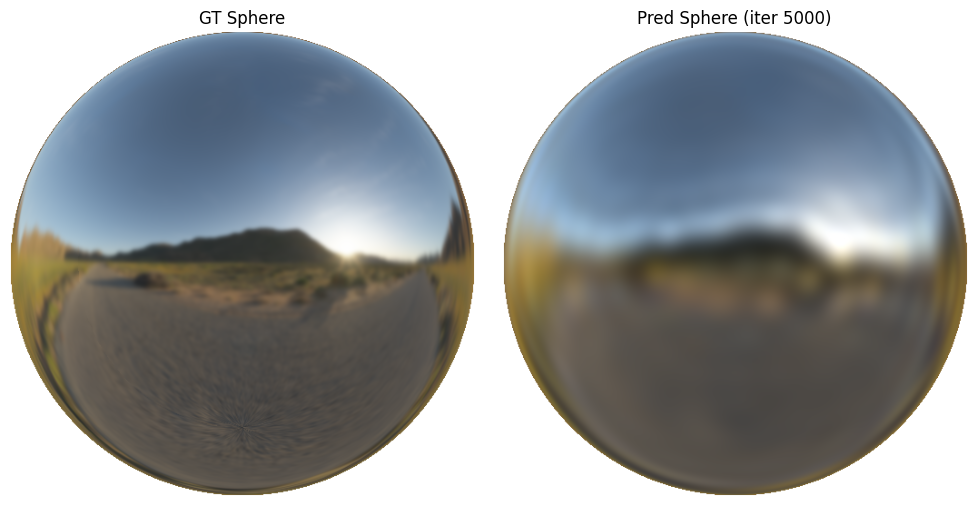

Training [SG]: 100%|██████████| 5000/5000 [00:43<00:00, 114.02it/s, psnr_b=29.20]

[iter 5000] full-env PSNR: 29.17 dB


In [ ]:
# Example: SG
model = train_env_model(
    exr_path,
    model_type="sg",
    # best results with sharpness between 256 and 64 (but 'pois' pattern become more visible:
    # lower sharpness value avoid this pattern, but quality degrades)
    model_kwargs={"num_lobes": 512, "max_sharpness": 64.0, "min_sharpness": 8.0},
    num_iters=5000,
    batch_size=4096,
    device=None,
    vis_interval=500,
)

Training [SH]:   0%|          | 0/5000 [00:00<?, ?it/s, psnr_b=13.52]

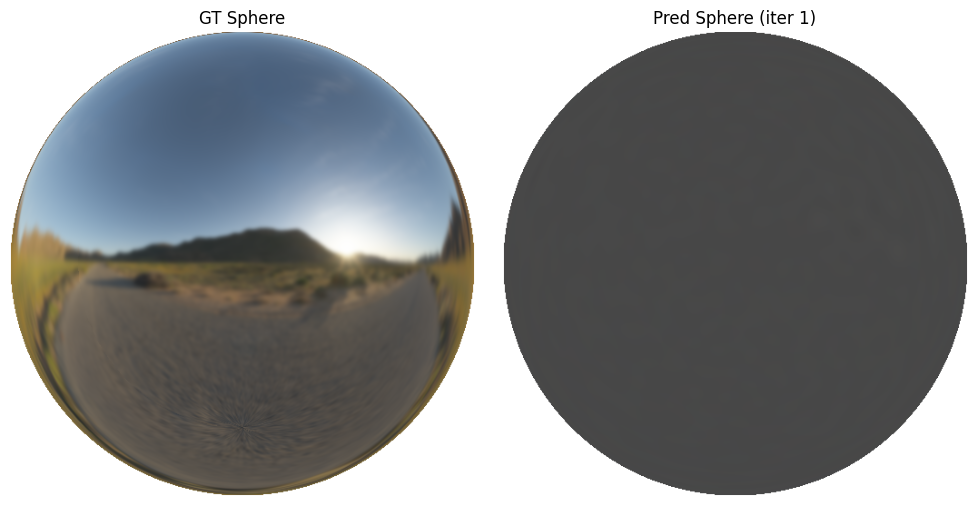

Training [SH]:   0%|          | 3/5000 [00:02<1:02:26,  1.33it/s, psnr_b=13.40]

[iter 1] full-env PSNR: 13.28 dB


Training [SH]:  10%|▉         | 498/5000 [00:42<05:59, 12.51it/s, psnr_b=15.60]

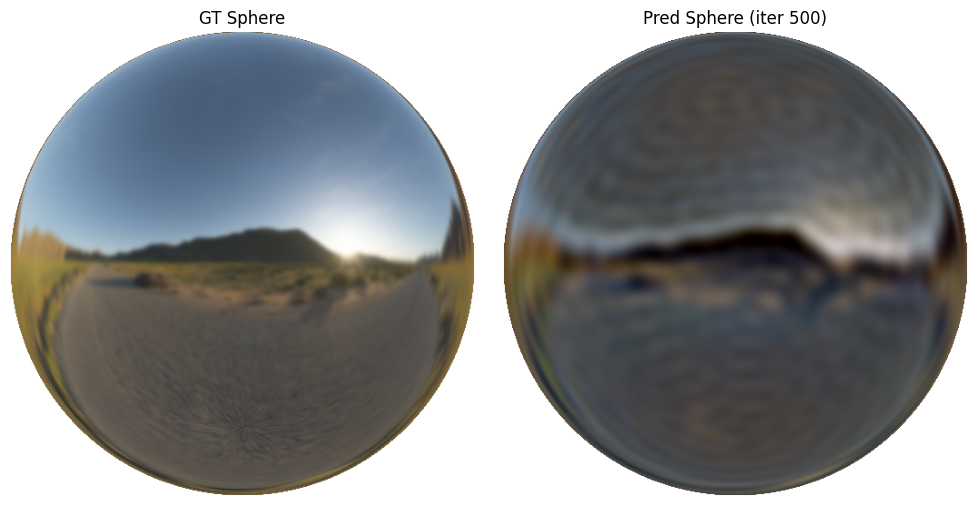

Training [SH]:  10%|█         | 502/5000 [00:45<22:52,  3.28it/s, psnr_b=15.75]

[iter 500] full-env PSNR: 15.73 dB


Training [SH]:  20%|█▉        | 998/5000 [01:33<05:12, 12.82it/s, psnr_b=17.42]

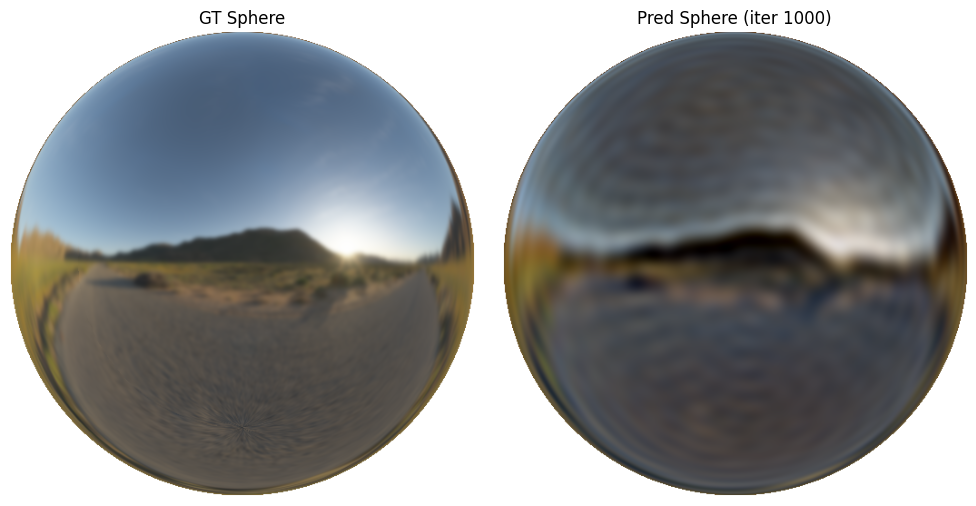

Training [SH]:  20%|██        | 1002/5000 [01:36<20:11,  3.30it/s, psnr_b=17.50]

[iter 1000] full-env PSNR: 17.36 dB


Training [SH]:  24%|██▎       | 1185/5000 [01:51<05:59, 10.62it/s, psnr_b=17.79]


KeyboardInterrupt: 

In [ ]:
# Example: SH
model = train_env_model(
    exr_path,
    model_type="sh",
    model_kwargs={"sh_degree": 31, "L_init": 31},
    num_iters=5000,
    batch_size=4096,
    device=None,
    vis_interval=500,
)